# Visualization of the Sleep Data for Sleep Cluster Nos 2 and 5

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import os
%matplotlib inline

In [3]:
data_series = pd.read_csv("Series1_2525_ClusterAssign.csv", sep=',', header = None)

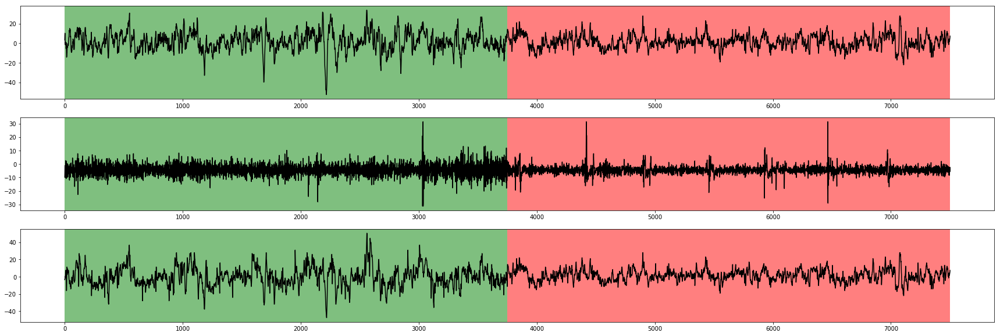

In [4]:
#30 seconds - 2 waves each
x1 = data_series.loc[0:3750,0]
y1 = data_series.loc[0:3750,1]
z1 = data_series.loc[0:3750,2]
c1 = data_series.loc[0:3750,3]
n1 = np.size(c1)
t1 = [int(i) for i in range(0,n1)]
start_p = 0
end_p = 3751


x2 = data_series.loc[243751:247501,0]
y2 = data_series.loc[243751:247501,1]
z2 = data_series.loc[243751:247501,2]
c2 = data_series.loc[243751:247501,3]
n2 = np.size(x2)
t2 = [int(i+15000) for i in range(0,n2)]
fig = plt.figure(figsize=(30,10))
ax1 = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)
t= []

x = x1
x = x.append(x2)
y = y1
y = y.append(y2)
z = z1
z = z.append(x2)
c = c1
c = c.append(c2)
#print(c)
d = np.column_stack((x,y,z))
dc = np.column_stack((x,y,z,c))

d1 = pd.DataFrame(d)
dc = pd.DataFrame(dc)
#print(d)
start_p1 = 0
end_p1 = 3750
start_p2 =  3750
end_p2 = 7500

ax1.plot(d1.loc[:,0],'k')
ax2.plot(d1.loc[:,1],'k')
ax3.plot(d1.loc[:,2],'k')
p = ax1.axvspan(start_p1, end_p1, facecolor='g', alpha=0.5)
q = ax1.axvspan(start_p2, end_p2, facecolor='r', alpha=0.5)
p = ax2.axvspan(start_p1, end_p1, facecolor='g', alpha=0.5)
q = ax2.axvspan(start_p2, end_p2, facecolor='r', alpha=0.5)
p = ax3.axvspan(start_p1, end_p1, facecolor='g', alpha=0.5)
q = ax3.axvspan(start_p2, end_p2, facecolor='r', alpha=0.5)

In [5]:
d = pd.DataFrame(d)
dc = pd.DataFrame(dc)

d = d.append(d)
d.to_csv("Series1_30_Repv1.csv", sep =',', header = False, index = False)

dc = dc.append(dc)
dc.to_csv("Series1_30_Rep_Label.csv", sep =',', header = False, index = False)

In [3]:
data_TICC = pd.read_csv("Series1_30_Repv1-Cluster-5200.csv", sep =',',header = None)
print(data_TICC)

               0          1          2    3
0       3.431373  -9.758824  -3.431373  1.0
1       8.333333  -6.547059  -3.431373  1.0
2      10.294118  -1.111765  -1.470588  1.0
3       6.372549  -2.347059   0.490196  1.0
4      -0.490196  -4.570588  -0.490196  1.0
5      -1.470588  -1.605882  -1.470588  1.0
6       1.470588  -9.264706   1.470588  1.0
7       0.490196   0.617647   6.372549  1.0
8      -0.490196   2.594118   7.352941  1.0
9       0.490196 -10.252941   6.372549  1.0
10     -1.470588  -5.805882   7.352941  1.0
11     -5.392157  -2.347059   7.352941  1.0
12     -3.431373 -10.747059   4.411765  1.0
13      0.490196  -5.558824  -1.470588  1.0
14     -0.490196   2.100000  -9.313725  1.0
15     -7.352941  -1.111765 -16.176471  1.0
16    -14.215686  -3.582353 -14.215686  1.0
17    -13.235294   0.123529   0.490196  1.0
18    -10.294118  -5.064706  11.274510  1.0
19     -9.313725 -10.005882  10.294118  1.0
20     -6.372549  -3.829412   5.392157  1.0
21     -3.431373  -5.064706   2.

In [8]:
fig = plt.figure(figsize=(50,10),dpi = 400)
ax1 = fig.add_subplot(211)
ax2 = fig.add_subplot(212)
#fig.tight_layout()
plt.subplots_adjust(hspace=0.2)
x1 = data_TICC.loc[:,0]
n = len(x1)
print(n)
clust = data_TICC.loc[:,3]
clust_num = clust.unique()
print(clust_num)
#x = [int(i) for i in x]
#print(str(howmanyclust) + "   <-- this many clusters")
#print(clust)
clust = np.asarray(clust, dtype = int)
#y = column(data, 1)

c = ['b', 'g', 'r', 'c', 'm', 'y']

ax1.plot(x1,'k')
#print(np.shape(clust))
mini = 0
currcol = nxtcol = 0
for i in range(1,n):
    currcol = c[clust[i-1]]
    nxtcol = c[clust[i]]
    if((i+1)==n):
        p = ax2.axvspan(mini, i-1, facecolor=c[clust[i]], alpha=0.5)
    if nxtcol == currcol:
        if mini == 0: 
            mini = i-1
        continue
    else:
        j = clust[i-1]
        p = ax2.axvspan(mini, i-1, facecolor=c[j], alpha=0.5)
        mini = 0
        ax2.set_title('Clustering by Experts', fontsize = 32)
print(mini, i)
    


#Expert Label:
data_label = pd.read_csv("Series1_30_Rep_Label.csv", sep =',',header=None)
#print(data_label)
x2 = data_label.loc[:,0]
n = len(x2)
print(n)
clust2 = data_label.loc[:,3]

clust_num2 = clust2.unique()
clust2 = np.asarray(clust2, dtype = int)
print(clust2)
ax2.plot(x2,'k')
#print(np.shape(clust2))
mini = 0
i=0
currcol = nxtcol = 0
for i in range(1,n):
    currcol = c[clust2[i-1]]
    nxtcol = c[clust2[i]]
    if((i+1)==n):
        p = ax1.axvspan(mini, i-1, facecolor=c[clust2[i]], alpha=0.5)
    if nxtcol == currcol:
        if mini == 0: 
            mini = i-1
        continue
    else:
        j = clust2[i-1]
        p = ax1.axvspan(mini, i-1, facecolor=c[j], alpha=0.5)
        mini = 0
        ax1.set_title('Clustering by TICC', fontsize = 32)
    
#fig.savefig("TICC vs Expert")

15004
[ 1.  0.]
(11253, 15003)
15004
[2 2 2 ..., 5 5 5]


In [2]:

fig = plt.figure(figsize=(50,10),dpi = 400)
x1 = data_TICC.loc[:,0]
n = len(x1)
print(n)
clust = data_TICC.loc[:,3]
clust_num = clust.unique()
print(clust_num)

clust = np.asarray(clust, dtype = int)
#y = column(data, 1)

c = ['b', 'g', 'r', 'c', 'm', 'y']

plt.plot(x1,'k')
#print(np.shape(clust))
mini = 0
currcol = nxtcol = 0
for i in range(1,n):
    currcol = c[clust[i-1]]
    nxtcol = c[clust[i]]
    if((i+1)==n):
        p = plt.axvspan(mini, i-1, facecolor=c[clust[i]], alpha=0.5)
    if nxtcol == currcol:
        if mini == 0: 
            mini = i-1
        continue
    else:
        j = clust[i-1]
        p = plt.axvspan(mini, i-1, facecolor=c[j], alpha=0.5)
        mini = 0
        #plt.title('Clustering by TICC', fontsize = 64)
print(mini, i)

#fig.savefig("Clustering by TICC")

NameError: name 'data_TICC' is not defined

In [5]:
c = ['b', 'g', 'r', 'c', 'm', 'y']

In [7]:
#Expert Label:
fig = plt.figure(figsize=(50,10),dpi = 400)
data_label = pd.read_csv("Series1_30_Rep_Label.csv", sep =',',header=None)
#print(data_label)
x2 = data_label.loc[:,0]
n = len(x2)
print(n)
clust2 = data_label.loc[:,3]

clust_num2 = clust2.unique()
clust2 = np.asarray(clust2, dtype = int)
print(clust2)
plt.plot(x2,'k')
#print(np.shape(clust2))
mini = 0
i=0
currcol = nxtcol = 0
for i in range(1,n):
    currcol = c[clust2[i-1]]
    nxtcol = c[clust2[i]]
    if((i+1)==n):
        p = plt.axvspan(mini, i-1, facecolor=c[clust2[i]], alpha=0.5)
    if nxtcol == currcol:
        if mini == 0: 
            mini = i-1
        continue
    else:
        j = clust2[i-1]
        p = plt.axvspan(mini, i-1, facecolor=c[j], alpha=0.5)
        mini = 0
        #plt.title('Clustering by Expert', fontsize = 64)
    
#fig.savefig("Clustering by  Expert")

15004
[2 2 2 ..., 5 5 5]


15004
(11253, 15003)


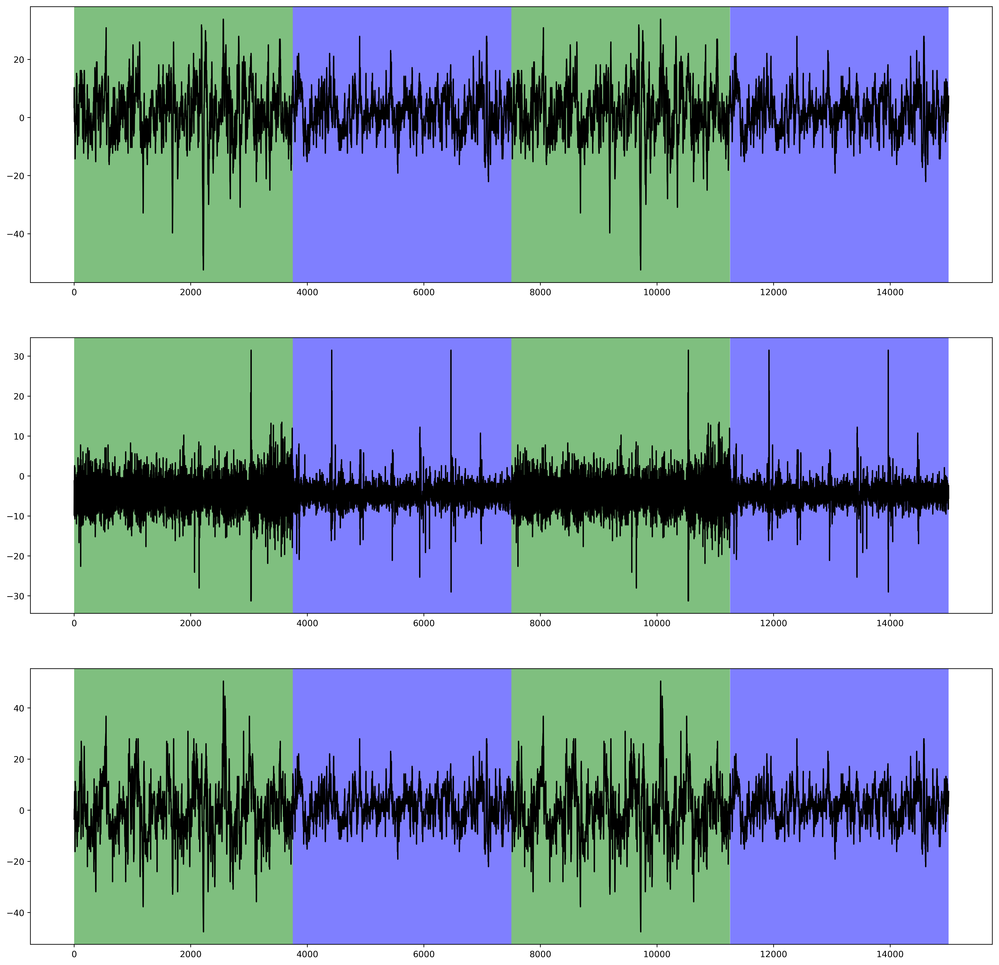

In [31]:
#TICC Clustering for all the sensors
fig = plt.figure(figsize=(20,20),dpi=400)
ax1 = fig.add_subplot(3,1,1)
ax2 = fig.add_subplot(3,1,2)
ax3 = fig.add_subplot(313)
x1 = data_TICC.loc[:,0]
x2 = data_TICC.loc[:,1]
x3 = data_TICC.loc[:,2]
n = len(x1)
print(n)
clust = data_TICC.loc[:,3]
clust_num = clust.unique()
#print(clust)

clust = np.asarray(clust, dtype = int)
#y = column(data, 1)

c = ['b', 'g', 'r', 'c', 'm', 'y']

ax1.plot(x1,'k')
ax2.plot(x2,'k')
ax3.plot(x3,'k')
#print(np.shape(clust))
mini = 0
currcol = nxtcol = 0
for i in range(1,n):
    currcol = c[clust[i-1]]
    nxtcol = c[clust[i]]
    if((i+1)==n):
        p1 = ax1.axvspan(mini, i-1, facecolor=c[clust[i]], alpha=0.5)
        p2 = ax2.axvspan(mini, i-1, facecolor=c[clust[i]], alpha=0.5)
        p3 = ax3.axvspan(mini, i-1, facecolor=c[clust[i]], alpha=0.5)
    if nxtcol == currcol:
        if mini == 0: 
            mini = i-1
        continue
    else:
        j = clust[i-1]
        p1 = ax1.axvspan(mini, i-1, facecolor=c[clust[i-1]], alpha=0.5)
        p2 = ax2.axvspan(mini, i-1, facecolor=c[clust[i-1]], alpha=0.5)
        p3 = ax3.axvspan(mini, i-1, facecolor=c[clust[i-1]], alpha=0.5)
        #plt.title('Clustering by TICC', fontsize = 64)
        mini = 0
print(mini, i)

fig.savefig("Clustering by TICC+A.")


15004
[2 2 2 ..., 5 5 5]


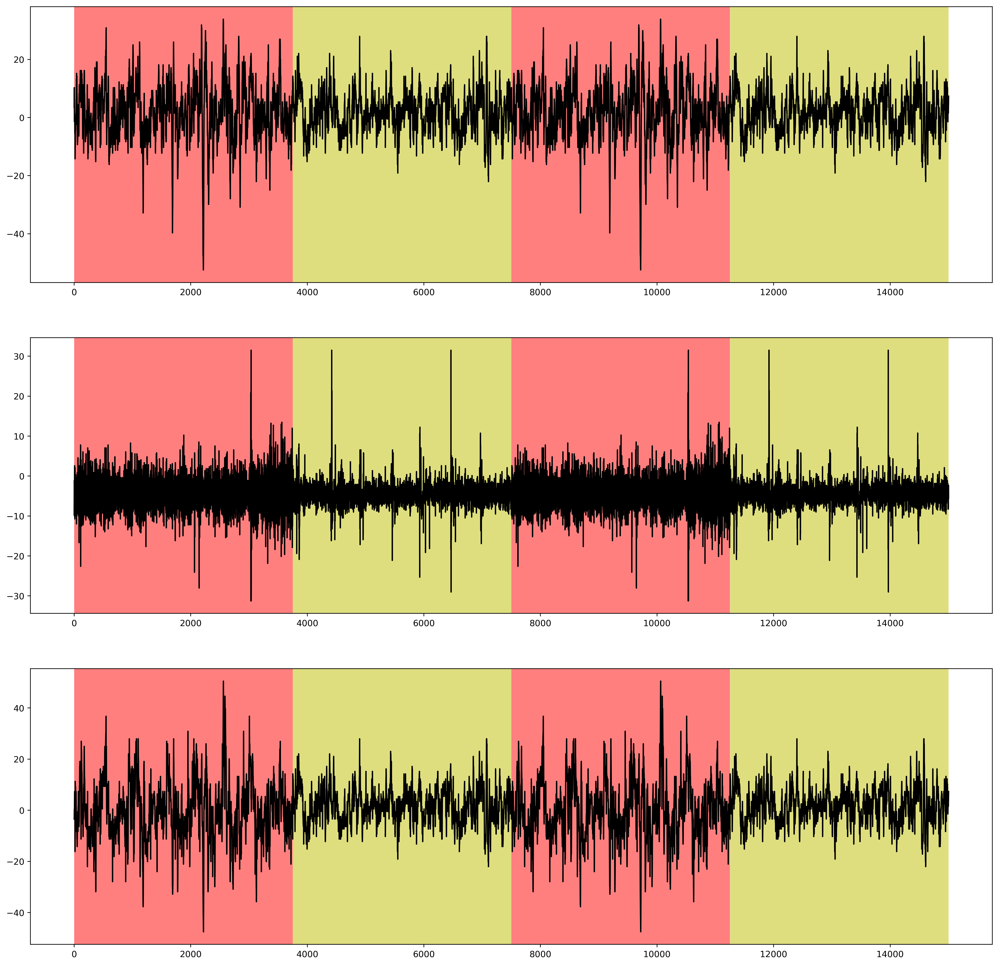

In [33]:
#Expert Label:
fig = plt.figure(figsize=(20,20),dpi = 400)
data_label = pd.read_csv("Series1_30_Rep_Label.csv", sep =',',header=None)
#print(data_label)
y1 = data_label.loc[:,0]
y2 = data_label.loc[:,1]
y3 = data_label.loc[:,2]
ax1 = fig.add_subplot(3,1,1)
ax2 = fig.add_subplot(3,1,2)
ax3 = fig.add_subplot(313)
n = len(x2)
print(n)
clust2 = data_label.loc[:,3]

clust_num2 = clust2.unique()
clust2 = np.asarray(clust2, dtype = int)
print(clust2)
ax1.plot(y1,'k')
ax2.plot(y2,'k')
ax3.plot(y3,'k')
#print(np.shape(clust2))
mini = 0
i=0
currcol = nxtcol = 0
for i in range(1,n):
    currcol = c[clust2[i-1]]
    nxtcol = c[clust2[i]]
    if((i+1)==n):
        p1 = ax1.axvspan(mini, i-1, facecolor=c[clust2[i]], alpha=0.5)
        p2 = ax2.axvspan(mini, i-1, facecolor=c[clust2[i]], alpha=0.5)
        p3 = ax3.axvspan(mini, i-1, facecolor=c[clust2[i]], alpha=0.5)
    if nxtcol == currcol:
        if mini == 0: 
            mini = i-1
        continue
    else:
        j = clust2[i-1]
        p1 = ax1.axvspan(mini, i-1, facecolor=c[clust2[i-1]], alpha=0.5)
        p2 = ax2.axvspan(mini, i-1, facecolor=c[clust2[i-1]], alpha=0.5)
        p3 = ax3.axvspan(mini, i-1, facecolor=c[clust2[i-1]], alpha=0.5)
        mini = 0
        #plt.title('Clustering by Expert', fontsize = 64)
    
fig.savefig("Clustering by  Expert - All Sensors!")